In [1]:
import pandas as pd
import json


In [2]:
# Load portfolio data
with open("./Data/portfolio.json") as f:
    try:
        portfolio = pd.DataFrame(json.load(f))
    except json.JSONDecodeError:
        # If single JSON objects, read line by line
        f.seek(0)
        portfolio = pd.DataFrame([json.loads(line) for line in f])

# Load transaction data: Note it was written as transcript.json
with open("./Data/transcript.json") as f:
    try:
        transactions = pd.DataFrame(json.load(f))
    except json.JSONDecodeError:
        f.seek(0)
        transactions = pd.DataFrame([json.loads(line) for line in f])

# Load profile data
with open("./Data/profile.json") as f:
    try:
        profile = pd.DataFrame(json.load(f))
    except json.JSONDecodeError:
        f.seek(0)
        profile = pd.DataFrame([json.loads(line) for line in f])

In [3]:
# Display basic info about each dataset
print("Portfolio Data:")
print(portfolio.info())

Portfolio Data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   reward      10 non-null     int64  
 1   channels    10 non-null     object 
 2   difficulty  10 non-null     int64  
 3   duration    10 non-null     float64
 4   offer_type  10 non-null     object 
 5   id          10 non-null     object 
dtypes: float64(1), int64(2), object(3)
memory usage: 612.0+ bytes
None


In [4]:
print("Transactions Data:")
print(transactions.info())
print("\nProfile Data:")
print(profile.info())

Transactions Data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306534 entries, 0 to 306533
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   person  306534 non-null  object
 1   event   306534 non-null  object
 2   value   306534 non-null  object
 3   time    306534 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 9.4+ MB
None

Profile Data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   id                17000 non-null  object 
 3   became_member_on  17000 non-null  object 
 4   income            14825 non-null  float64
dtypes: float64(1), int64(1), object(3)
memory usage: 664.2+ KB
None


In [5]:
portfolio.head()


,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4.0,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7


In [6]:
transactions.sample(15)

,person,event,value,time
193045,e1c6ff66f7a84bea8e9f1024b8738571,transaction,{'amount': 23.59},468
138208,f70d70344b9449ebab97431b71c6559b,transaction,{'amount': 0.7},366
223,b268f71b99b94e1485ed1ccd4c20007b,offer received,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},0
284972,b9f6572096dc47a5bb427f9957909735,transaction,{'amount': 4.61},630
108505,dc2b465941b64c7dad3c60e77cac200a,offer completed,{'offer_id': '2906b810c7d4411798c6938adc9daaa5...,318
249198,b923ef146c9d48518edc006f611f0f5c,offer received,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},576
4414,b42e46d4f0464bdc89030ac172d5222f,offer received,{'offer id': '2298d6c36e964ae4a3e7e9706d1fb8c2'},0
233099,b1738645627a49c1b85c47c78905698d,offer viewed,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},540
253093,58946f6fe2b54f2ba4aaa95931b77d9e,offer received,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},576
68075,021616b8deea46438e3badc7fca5894d,offer viewed,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},168


transaction df contains information specific transaction across the promotion period.

• `person` is the customer membership identification.\
• `event` is the event - either offer received, offer viewed, offer complete or transaction. \
• `value.offer.id` is the promotion identification. \
• `value.amount` is the amount spent in GBP for a given transaction. \
• `value.offer_id` is the promotion identification. \
• `value.reward` is the monetary value of the promotion. \
• `time` time from the beginning of the promotion period.

Given the above, we can see that the `value` column is a dictionary with the following keys:
• `offer id`
• `amount`
• `offer_id`
• `reward`

The best approach is to split the dataframe into separate dataframes based on event types:
- offer received
- offer viewed
- transaction
- offer completed




In [7]:
# Split the DataFrame and store in a dictionary
transcript_dict = {
    "offer_received": transactions[transactions["event"] == "offer received"],
    "offer_viewed": transactions[transactions["event"] == "offer viewed"],
    "offer_completed": transactions[transactions["event"] == "offer completed"],
    "transactions": transactions[transactions["event"] == "transaction"],
}

# Reset index for all DataFrames in the dictionary
for key in transcript_dict:
    transcript_dict[key] = transcript_dict[key].reset_index(drop=True)

transcript_dict["offer_received"].sample(15)

,person,event,value,time
1506,126dc0f131804b21b2714172adf149e7,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
10194,66e876e1037346e281c43081d92310ad,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
63291,cdb4c4ee3fba4b41a19ba6166bcc78eb,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},504
45061,f1afe0c2b7894a29a4b021fcafcba060,offer received,{'offer id': '2298d6c36e964ae4a3e7e9706d1fb8c2'},408
6323,beac80ebf5c84f278be6412ee2b52ddd,offer received,{'offer id': 'ae264e3637204a6fb9bb56bc8210ddfd'},0
65390,1ab5e1d8f3fa4588af94253e2a09520f,offer received,{'offer id': 'ae264e3637204a6fb9bb56bc8210ddfd'},576
24118,c48c23ad5e914e2cb4e66661f83886bf,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},168
58437,3fd0c8cfb67c49aa8e4c998638e463cd,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},504
24217,5fecc62c4ec14cd483894563b6f49549,offer received,{'offer id': 'ae264e3637204a6fb9bb56bc8210ddfd'},168
46415,b4ee4a7e6eab43a19d072a5f954529e0,offer received,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},408


In [8]:
transcript_dict["offer_viewed"].head()


,person,event,value,time
0,389bc3fa690240e798340f5a15918d5c,offer viewed,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},0
1,d1ede868e29245ea91818a903fec04c6,offer viewed,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},0
2,102e9454054946fda62242d2e176fdce,offer viewed,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0
3,02c083884c7d45b39cc68e1314fec56c,offer viewed,{'offer id': 'ae264e3637204a6fb9bb56bc8210ddfd'},0
4,be8a5d1981a2458d90b255ddc7e0d174,offer viewed,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},0


In [9]:
transcript_dict["offer_completed"].head()


,person,event,value,time
0,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,offer completed,{'offer_id': '2906b810c7d4411798c6938adc9daaa5...,0
1,fe97aa22dd3e48c8b143116a8403dd52,offer completed,{'offer_id': 'fafdcd668e3743c1bb461111dcafc2a4...,0
2,629fc02d56414d91bca360decdfa9288,offer completed,{'offer_id': '9b98b8c7a33c4b65b9aebfe6a799e6d9...,0
3,676506bad68e4161b9bbaffeb039626b,offer completed,{'offer_id': 'ae264e3637204a6fb9bb56bc8210ddfd...,0
4,8f7dd3b2afe14c078eb4f6e6fe4ba97d,offer completed,{'offer_id': '4d5c57ea9a6940dd891ad53e9dbe8da0...,0


In [10]:
transcript_dict["transactions"].head()

,person,event,value,time
0,02c083884c7d45b39cc68e1314fec56c,transaction,{'amount': 0.83},0
1,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,{'amount': 34.56},0
2,54890f68699049c2a04d415abc25e717,transaction,{'amount': 13.23},0
3,b2f1cd155b864803ad8334cdf13c4bd2,transaction,{'amount': 19.51},0
4,fe97aa22dd3e48c8b143116a8403dd52,transaction,{'amount': 18.97},0


In [11]:
# Define a function to check the format of the 'value' column
def check_value_format(df, expected_keys):
    """
    Check if all values in the 'value' column have the expected keys.

    Parameters:
        df (pd.DataFrame): The DataFrame to check.
        expected_keys (list): List of keys that should be present in the 'value' dictionary.

    Returns:
        bool: True if all values match the expected format, False otherwise.
    """

    def is_valid_format(value_dict):
        return isinstance(value_dict, dict) and all(
            key in value_dict for key in expected_keys
        )

    return df["value"].apply(is_valid_format).all()




In [12]:
# Check format for each DataFrame in the dictionary
format_checks = {
    "offer_received": check_value_format(
        transcript_dict["offer_received"], ["offer id"]
    ),
    "offer_viewed": check_value_format(transcript_dict["offer_viewed"], ["offer id"]),
    "offer_completed": check_value_format(
        transcript_dict["offer_completed"], ["offer id"]
    ),
    "transactions": check_value_format(transcript_dict["transactions"], ["amount"]),
}

# Define expected keys for each DataFrame
expected_keys = {
    "offer_received": ["offer id"],
    "offer_viewed": ["offer id"],
    "offer_completed": ["offer id"],
    "transactions": ["amount"]
}

# Check for unexpected keys in each DataFrame
for key, df in transcript_dict.items():
    unexpected_keys = set()
    for value in df['value']:
        if isinstance(value, dict):
            unexpected_keys.update(set(value.keys()) - set(expected_keys[key]))
    
    if unexpected_keys:
        print(f"Unique unexpected keys in '{key}': {sorted(unexpected_keys)}")
    else:
        print(f"No unexpected keys found in '{key}'")

No unexpected keys found in 'offer_received'
No unexpected keys found in 'offer_viewed'
Unique unexpected keys in 'offer_completed': ['offer_id', 'reward']
No unexpected keys found in 'transactions'


In [13]:
# now we'll split the offer_completed dataframe's value column into separate columns: offer_id and reward
# Process all DataFrames in transcript_dict to expand their value columns
for key, df in transcript_dict.items():
    # Get all unique keys from the value dictionaries
    all_keys = set()
    for value_dict in df['value']:
        if isinstance(value_dict, dict):
            all_keys.update(value_dict.keys())
    
    # Create normalized DataFrame from value column
    value_df = pd.json_normalize(df['value'])
    
    # Rename columns to match the original keys
    value_df.columns = [col.replace('.', '_') for col in value_df.columns]
    
    # Join the expanded columns back to the original DataFrame
    transcript_dict[key] = df.join(value_df)
    
    # Drop the original value column
    transcript_dict[key] = transcript_dict[key].drop(columns=['value'])

# Display the processed offer_completed DataFrame
transcript_dict["offer_completed"].head()

,person,event,time,offer_id,reward
0,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,offer completed,0,2906b810c7d4411798c6938adc9daaa5,2
1,fe97aa22dd3e48c8b143116a8403dd52,offer completed,0,fafdcd668e3743c1bb461111dcafc2a4,2
2,629fc02d56414d91bca360decdfa9288,offer completed,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,5
3,676506bad68e4161b9bbaffeb039626b,offer completed,0,ae264e3637204a6fb9bb56bc8210ddfd,10
4,8f7dd3b2afe14c078eb4f6e6fe4ba97d,offer completed,0,4d5c57ea9a6940dd891ad53e9dbe8da0,10


In [14]:
# Check number of unique values for each column in each DataFrame
for df_name, df in transcript_dict.items():
    print(f"\nDataFrame: {df_name}")
    for col in df.columns:
        unique_count = df[col].nunique()
        print(f"Column '{col}' has {unique_count} unique value{'s' if unique_count != 1 else ''}")



DataFrame: offer_received
Column 'person' has 16994 unique values
Column 'event' has 1 unique value
Column 'time' has 6 unique values
Column 'offer id' has 10 unique values

DataFrame: offer_viewed
Column 'person' has 16834 unique values
Column 'event' has 1 unique value
Column 'time' has 120 unique values
Column 'offer id' has 10 unique values

DataFrame: offer_completed
Column 'person' has 12774 unique values
Column 'event' has 1 unique value
Column 'time' has 120 unique values
Column 'offer_id' has 8 unique values
Column 'reward' has 4 unique values

DataFrame: transactions
Column 'person' has 16578 unique values
Column 'event' has 1 unique value
Column 'time' has 120 unique values
Column 'amount' has 5103 unique values


In [15]:
# Drop the event column from each DataFrame in transcript_dict
for df_name, df in transcript_dict.items():
    if 'event' in df.columns:
        transcript_dict[df_name] = df.drop(columns=['event'])


In [16]:
transcript_dict["offer_completed"].sample(15)

,person,time,offer_id,reward
26956,ad3c97ee0ec140d0bf53256a258c0cd0,582,f19421c1d4aa40978ebb69ca19b0e20d,5
20779,592c5c82eacf47c7b989afcee87c604f,504,2298d6c36e964ae4a3e7e9706d1fb8c2,3
5433,e46283405b094b62806e05f24c5f0304,180,4d5c57ea9a6940dd891ad53e9dbe8da0,10
22510,3cc18472ed634128b409baa2a48700f4,522,9b98b8c7a33c4b65b9aebfe6a799e6d9,5
13363,09ccb706f86c4d1ca7a35d054caa9fb5,390,f19421c1d4aa40978ebb69ca19b0e20d,5
26266,08926f1f08c34a4a9681ab3d6a5ef17e,576,ae264e3637204a6fb9bb56bc8210ddfd,10
24499,ba9fb3e4a7084361914c1647d871d27e,552,0b1e1539f2cc45b7b9fa7c272da2e1d7,5
23886,c7a5d7bab83a4d82a7f977b3d586f3d4,540,2906b810c7d4411798c6938adc9daaa5,2
21239,767cbf2cf50f462782d60d411f6c4e4c,510,fafdcd668e3743c1bb461111dcafc2a4,2
9706,b61bc5743b0949c5972f839075ffcdf3,294,fafdcd668e3743c1bb461111dcafc2a4,2


In [17]:
transcript_dict["offer_viewed"].sample(15)


,person,time,offer id
10921,c62495616d1a475e9d6af7827c6dfd86,168,f19421c1d4aa40978ebb69ca19b0e20d
28602,6f3d8c186bc6431f87c401446dc728d4,396,3f207df678b143eea3cee63160fa8bed
32315,9895c026669a4010af96aceb0eb52c5e,414,4d5c57ea9a6940dd891ad53e9dbe8da0
33575,9be6bbcf27de4f61ab2db138aa808691,420,ae264e3637204a6fb9bb56bc8210ddfd
4476,3c9568abe3584e80940440d2c51402b3,12,fafdcd668e3743c1bb461111dcafc2a4
24655,ad3c97ee0ec140d0bf53256a258c0cd0,348,2298d6c36e964ae4a3e7e9706d1fb8c2
33313,c1c3149b7af8483b8ea67d87c74334af,420,fafdcd668e3743c1bb461111dcafc2a4
16375,dc10cfda528a47ef80abb2af8b120c3d,192,5a8bc65990b245e5a138643cd4eb9837
21401,aed59d1f47be4f73ba402ede49666b7a,336,4d5c57ea9a6940dd891ad53e9dbe8da0
42369,ed1418961ec34a12bed2a53bb712b58d,516,5a8bc65990b245e5a138643cd4eb9837


In [18]:
transcript_dict["offer_received"].sample(15)


,person,time,offer id
23067,bd920b7b033d42fb9d97be92343a9aef,168,4d5c57ea9a6940dd891ad53e9dbe8da0
37776,37f17911d9c24f9e81f97fc250e7a2dc,336,fafdcd668e3743c1bb461111dcafc2a4
4954,2951d232091740aba36fffbe039f36ca,0,2298d6c36e964ae4a3e7e9706d1fb8c2
4722,dad66222e2354b939907a680fff6640c,0,f19421c1d4aa40978ebb69ca19b0e20d
68213,ba22b168c2154a199542dd671ae74bf7,576,fafdcd668e3743c1bb461111dcafc2a4
73226,96a746b7cae4426598c97c147eb04743,576,3f207df678b143eea3cee63160fa8bed
49013,0cc67e089ff64108a2fa117971f666f9,408,0b1e1539f2cc45b7b9fa7c272da2e1d7
61749,67401af8aa0a40eb9946d62c0bc19571,504,0b1e1539f2cc45b7b9fa7c272da2e1d7
13789,b84926f7fc6a48cfac59341a4a1a2783,168,ae264e3637204a6fb9bb56bc8210ddfd
10705,f25ddf8a89664bf594d972b8aecd428f,0,0b1e1539f2cc45b7b9fa7c272da2e1d7


In [19]:
transcript_dict["transactions"].sample(15)

,person,time,amount
8449,9e59453b4ed44df29751981085bd4841,54,17.84
28574,fab2c0f42db542018a7adb68039c2cac,180,27.09
115454,ca3ed3e47a1e4ceea8dcd8b2bbaf1076,600,15.32
60860,cb181f5812ac40e8baed53bbbb8d3d12,360,1.04
13010,184368dab2ce4be0a196e3f6bf72fd9b,78,9.47
36804,108651eb092b490d85cb4f8e492040a4,222,17.10
118774,b4e842928968481f988f869561cc0257,618,22.65
74280,d335181e52ea468891d3bf4aec67d10c,426,13.43
31287,e6843a4996574eb693ab864ecc406d56,192,1.75
124766,3b11836dae49422d8ee4110d8e2fbde4,642,0.68


In [20]:
profile.head()

,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [21]:
profile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   id                17000 non-null  object 
 3   became_member_on  17000 non-null  object 
 4   income            14825 non-null  float64
dtypes: float64(1), int64(1), object(3)
memory usage: 664.2+ KB


In [22]:
# Print info for all DataFrames
print("Portfolio DataFrame Info:")
portfolio.info()
print("\nProfile DataFrame Info:")
profile.info()
print("\nTranscript DataFrames Info:")
for df_name, df in transcript_dict.items():
    print(f"\n{df_name.capitalize()} DataFrame Info:")
    df.info()


Portfolio DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   reward      10 non-null     int64  
 1   channels    10 non-null     object 
 2   difficulty  10 non-null     int64  
 3   duration    10 non-null     float64
 4   offer_type  10 non-null     object 
 5   id          10 non-null     object 
dtypes: float64(1), int64(2), object(3)
memory usage: 612.0+ bytes

Profile DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   id                17000 non-null  object 
 3   became_member_on  17000 non-null  object 
 4   income            14825 non-null  float64
dtypes: float64(

# Data Preparation


In [23]:
# Import necessary libraries
import numpy as np
from datetime import datetime


# --- Portfolio Data Preparation ---
# Rename columns for consistency
portfolio.rename(columns={'id': 'offer_id'}, inplace=True)

# --- Profile Data Preparation ---
# Convert 'became_member_on' to datetime
profile['became_member_on'] = pd.to_datetime(profile['became_member_on'], format='%Y%m%d')

# Calculate membership duration (in days)
profile['membership_duration'] = (datetime.today() - profile['became_member_on']).dt.days

# Create age groups
profile['age_group'] = pd.cut(profile['age'], bins=[0, 18, 35, 50, 65, 100], 
                              labels=['<18', '18-35', '35-50', '50-65', '65+'])

# Create income brackets
profile['income_bracket'] = pd.cut(profile['income'], bins=[0, 30000, 60000, 90000, 120000, np.inf], 
                                   labels=['<30k', '30k-60k', '60k-90k', '90k-120k', '120k+'])


# Handle missing values in profile
profile["gender"].fillna("Unknown", inplace=True)
profile["income"].fillna(profile["income"].median(), inplace=True)

/tmp/ipykernel_9773/3834342195.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  profile["gender"].fillna("Unknown", inplace=True)
/tmp/ipykernel_9773/3834342195.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', t

In [24]:
profile.sample(15)

,gender,age,id,became_member_on,income,membership_duration,age_group,income_bracket
13273,Unknown,118,a92d74444f7e4cb18181555dfa9b3564,2016-07-30,64000.0,3102,NaN,NaN
13322,M,93,57742106c75b4a2082a223f6d86ab942,2017-02-18,90000.0,2899,65+,60k-90k
8337,M,33,908ed9c56d3c43aa9a644a56595f70d0,2017-05-20,38000.0,2808,18-35,30k-60k
9310,Unknown,118,4078608e9fe649918845fdb162bdb094,2018-02-21,64000.0,2531,NaN,NaN
16756,M,70,8524d450673b4c24869b6c94380006de,2018-06-04,75000.0,2428,65+,60k-90k
1654,M,43,cd02713a74cf44958e270a9659d8f661,2015-06-07,39000.0,3521,35-50,30k-60k
3119,Unknown,118,efac38533e68478898f6903a0abd7b58,2018-06-04,64000.0,2428,NaN,NaN
2396,M,56,3c0aab5ec5c84358ae54619b88df5b2e,2015-11-29,79000.0,3346,50-65,60k-90k
7646,Unknown,118,2d6157e5b11646968a5c5062f4fde730,2015-10-07,64000.0,3399,NaN,NaN
1307,M,20,aef583f3c3614f9e96d7940df55510b2,2018-04-27,75000.0,2466,18-35,60k-90k


In [25]:
# --- Transcript Data Preparation ---
# Split transcript into separate DataFrames based on event type
transcript_dict = {
    "offer_received": transactions[transactions["event"] == "offer received"],
    "offer_viewed": transactions[transactions["event"] == "offer viewed"],
    "offer_completed": transactions[transactions["event"] == "offer completed"],
    "transactions": transactions[transactions["event"] == "transaction"],
}

# Reset index for all DataFrames
for key in transcript_dict:
    transcript_dict[key] = transcript_dict[key].reset_index(drop=True)

# Extract 'offer id' and 'amount' from the 'value' column
for key in ["offer_received", "offer_viewed", "offer_completed"]:
    transcript_dict[key]["offer_id"] = transcript_dict[key]["value"].apply(
        lambda x: x.get("offer id")
    )

transcript_dict["transactions"]["amount"] = transcript_dict["transactions"][
    "value"
].apply(lambda x: x.get("amount"))

# Drop the original 'value' column
for key in transcript_dict:
    transcript_dict[key] = transcript_dict[key].drop(columns=["value"])

In [26]:
# --- Merge DataFrames ---
# Merge offer_received, offer_viewed, and offer_completed
offer_activity = pd.merge(
    transcript_dict["offer_received"][["person", "offer_id", "time"]],
    transcript_dict["offer_viewed"][["person", "offer_id", "time"]],
    on=["person", "offer_id"],
    suffixes=("_received", "_viewed"),
    how="left",
)

offer_activity = pd.merge(
    offer_activity,
    transcript_dict["offer_completed"][["person", "offer_id", "time"]],
    on=["person", "offer_id"],
    how="left",
)

offer_activity.rename(columns={"time": "time_completed"}, inplace=True)

# Merge with portfolio to get offer details
offer_activity = pd.merge(offer_activity, portfolio, on="offer_id", how="left")

# Merge with profile to get customer demographics
offer_activity = pd.merge(
    offer_activity, profile, left_on="person", right_on="id", how="left"
)

# Merge with transaction data to get completion times
offer_activity = pd.merge(
    offer_activity,
    transcript_dict["transactions"][["person", "time", "amount"]],
    left_on=["person", "time_completed"],
    right_on=["person", "time"],
    how="left"
)

offer_activity.sample(5)

,person,offer_id,time_received,time_viewed,time_completed,reward,channels,difficulty,duration,offer_type,gender,age,id,became_member_on,income,membership_duration,age_group,income_bracket,time,amount
21298,8fbc24ca2c8a4f16873fbdfe6b29f5e9,fafdcd668e3743c1bb461111dcafc2a4,168,336.0,NaN,2,"[web, email, mobile, social]",10,10.0,discount,M,34,8fbc24ca2c8a4f16873fbdfe6b29f5e9,2016-09-29,57000.0,3041,18-35,30k-60k,NaN,NaN
47487,3b61ad3edcab45dd839f15e3fb1727e2,f19421c1d4aa40978ebb69ca19b0e20d,336,462.0,NaN,5,"[web, email, mobile, social]",5,5.0,bogo,F,77,3b61ad3edcab45dd839f15e3fb1727e2,2018-06-25,78000.0,2407,65+,60k-90k,NaN,NaN
89292,4a0d86f143f147cdbdd84ae1123151b1,4d5c57ea9a6940dd891ad53e9dbe8da0,576,576.0,NaN,10,"[web, email, mobile, social]",10,5.0,bogo,F,65,4a0d86f143f147cdbdd84ae1123151b1,2018-06-21,92000.0,2411,50-65,90k-120k,NaN,NaN
85622,a9b2b6471a0b4e4ca8b645dff2a92b9f,fafdcd668e3743c1bb461111dcafc2a4,576,30.0,NaN,2,"[web, email, mobile, social]",10,10.0,discount,M,44,a9b2b6471a0b4e4ca8b645dff2a92b9f,2017-08-11,54000.0,2725,35-50,30k-60k,NaN,NaN
59027,d9436dd24c464d80bae8a36dc7c6867e,9b98b8c7a33c4b65b9aebfe6a799e6d9,408,NaN,NaN,5,"[web, email, mobile]",5,7.0,bogo,M,28,d9436dd24c464d80bae8a36dc7c6867e,2017-09-04,54000.0,2701,18-35,30k-60k,NaN,NaN


In [27]:
offer_activity.isna().sum()


person                     0
offer_id                   0
time_received              0
time_viewed            15992
time_completed         95321
reward                     0
channels                   0
difficulty                 0
duration                   0
offer_type                 0
gender                     0
age                        0
id                         0
became_member_on           0
income                     0
membership_duration        0
age_group              12512
income_bracket         12487
time                   95321
amount                 95321
dtype: int64

In [28]:
valid_time_offers = offer_activity.copy()
# Calculate time_to_complete only for valid received/viewed times
valid_time_offers["time_to_complete"] = np.where(
    offer_activity["time_received"].notna() & offer_activity["time_viewed"].notna(),
    offer_activity["time_viewed"] - offer_activity["time_received"],
    np.nan,
)


valid_time_offers.sample(15)

,person,offer_id,time_received,time_viewed,time_completed,reward,channels,difficulty,duration,offer_type,...,age,id,became_member_on,income,membership_duration,age_group,income_bracket,time,amount,time_to_complete
10437,b86ca0e395db455b804efb06607d0ea7,3f207df678b143eea3cee63160fa8bed,0,564.0,NaN,0,"[web, email, mobile]",0,4.0,informational,...,56,b86ca0e395db455b804efb06607d0ea7,2016-10-03,89000.0,3037,50-65,60k-90k,NaN,NaN,564.0
46641,82402ee635014ca1b864a7c13eee33ed,0b1e1539f2cc45b7b9fa7c272da2e1d7,336,414.0,NaN,5,"[web, email]",20,10.0,discount,...,54,82402ee635014ca1b864a7c13eee33ed,2016-04-30,77000.0,3193,50-65,60k-90k,NaN,NaN,78.0
2111,3e449851dce64101a09e5e11ec1aded9,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,60.0,NaN,5,"[web, email, mobile]",5,7.0,bogo,...,37,3e449851dce64101a09e5e11ec1aded9,2018-02-20,54000.0,2532,35-50,30k-60k,NaN,NaN,60.0
45610,a5b421b4863d499092959fce048cb9c4,fafdcd668e3743c1bb461111dcafc2a4,336,6.0,NaN,2,"[web, email, mobile, social]",10,10.0,discount,...,40,a5b421b4863d499092959fce048cb9c4,2015-11-17,71000.0,3358,35-50,60k-90k,NaN,NaN,-330.0
55692,7e5e7db0dea54e8ea8ecd051d0720898,fafdcd668e3743c1bb461111dcafc2a4,408,414.0,NaN,2,"[web, email, mobile, social]",10,10.0,discount,...,61,7e5e7db0dea54e8ea8ecd051d0720898,2017-08-15,79000.0,2721,50-65,60k-90k,NaN,NaN,6.0
57617,573580dbf2f9437e97863a8e102435db,4d5c57ea9a6940dd891ad53e9dbe8da0,408,NaN,NaN,10,"[web, email, mobile, social]",10,5.0,bogo,...,68,573580dbf2f9437e97863a8e102435db,2018-05-07,34000.0,2456,65+,30k-60k,NaN,NaN,NaN
42398,5bb68945637b469ab9b46c3853085550,2298d6c36e964ae4a3e7e9706d1fb8c2,336,180.0,NaN,3,"[web, email, mobile, social]",7,7.0,discount,...,25,5bb68945637b469ab9b46c3853085550,2017-12-31,63000.0,2583,18-35,60k-90k,NaN,NaN,-156.0
54651,612071e0a69046acb1fff4d8762d264b,4d5c57ea9a6940dd891ad53e9dbe8da0,408,24.0,NaN,10,"[web, email, mobile, social]",10,5.0,bogo,...,36,612071e0a69046acb1fff4d8762d264b,2018-02-24,73000.0,2528,35-50,60k-90k,NaN,NaN,-384.0
1058,8cff87ebddf24e459b4f0ddda4b56383,5a8bc65990b245e5a138643cd4eb9837,0,108.0,NaN,0,"[email, mobile, social]",0,3.0,informational,...,77,8cff87ebddf24e459b4f0ddda4b56383,2013-11-23,73000.0,4082,65+,60k-90k,NaN,NaN,108.0
71174,d2cbcf6fac5b47149b822875c3c08898,2906b810c7d4411798c6938adc9daaa5,504,36.0,NaN,2,"[web, email, mobile]",10,7.0,discount,...,30,d2cbcf6fac5b47149b822875c3c08898,2018-01-08,47000.0,2575,18-35,30k-60k,NaN,NaN,-468.0


In [29]:
valid_time_offers.isna().any()


person                 False
offer_id               False
time_received          False
time_viewed             True
time_completed          True
reward                 False
channels               False
difficulty             False
duration               False
offer_type             False
gender                 False
age                    False
id                     False
became_member_on       False
income                 False
membership_duration    False
age_group               True
income_bracket          True
time                    True
amount                  True
time_to_complete        True
dtype: bool

In [30]:
# Create focused dataframe with columns from valid_time_offers and offer_activity
offer_activity_focused = pd.concat([
    offer_activity[['person', 'offer_id', 'time_received', 'reward', 'channels', 
                   'difficulty', 'duration', 'offer_type', 'gender', 'age', 'id',
                   'became_member_on', 'income', 'membership_duration', 
                   'age_group', 'income_bracket']],
    valid_time_offers[['time_to_complete']]
], axis=1)

# Create purchase_with_offer column using valid_time_offers data
offer_activity_focused["purchase_with_offer"] = valid_time_offers["time_to_complete"].notna()

# Create offer_status column with numbered system using combined data
conditions = [
    # Purchased without offer (no offer viewed or completed, but has transaction)
    (
        valid_time_offers["time_viewed"].isna()
        & valid_time_offers["time_completed"].isna()
        & offer_activity["amount"].notna()
    ),
    # Offer made but unsuccessful (viewed but not completed within duration)
    (
        valid_time_offers["time_viewed"].notna()
        & (
            valid_time_offers["time_completed"].isna()
            | (valid_time_offers["time_to_complete"] > offer_activity["duration"])
        )
    ),
    # Offer made and successful (viewed and completed within duration)
    (
        valid_time_offers["time_viewed"].notna()
        & valid_time_offers["time_completed"].notna()
        & (valid_time_offers["time_to_complete"] <= offer_activity["duration"])
    ),
    # Offer received but not viewed
    (valid_time_offers["time_received"].notna() & valid_time_offers["time_viewed"].isna()),
]

choices = [
    1,  # Purchased without offer
    2,  # Offer made but unsuccessful
    3,  # Offer made and successful
    4,  # Offer received but not viewed
]

offer_activity_focused["offer_status"] = np.select(
    conditions, choices, default=0
)  # 0 for no activity


# Create a more robust null handling strategy
# First drop columns that are completely empty
valid_time_offers = valid_time_offers.dropna(axis=1, how='all')



offer_activity_focused.sample(15)

,person,offer_id,time_received,reward,channels,difficulty,duration,offer_type,gender,age,id,became_member_on,income,membership_duration,age_group,income_bracket,time_to_complete,purchase_with_offer,offer_status
76904,0d430e04265c4049809fe2ce680940ee,fafdcd668e3743c1bb461111dcafc2a4,504,2,"[web, email, mobile, social]",10,10.0,discount,M,27,0d430e04265c4049809fe2ce680940ee,2018-01-13,62000.0,2570,18-35,60k-90k,12.0,True,2
43304,07a00827302441ee968555e2fd20dbcd,0b1e1539f2cc45b7b9fa7c272da2e1d7,336,5,"[web, email]",20,10.0,discount,F,48,07a00827302441ee968555e2fd20dbcd,2017-09-02,85000.0,2703,35-50,60k-90k,NaN,False,4
72798,f173f2b63b5c474fbaf848f60a8f38cf,2906b810c7d4411798c6938adc9daaa5,504,2,"[web, email, mobile]",10,7.0,discount,M,22,f173f2b63b5c474fbaf848f60a8f38cf,2018-01-14,59000.0,2569,18-35,30k-60k,NaN,False,4
94046,ddc3173da9f645ddb3b1098994216fb5,9b98b8c7a33c4b65b9aebfe6a799e6d9,576,5,"[web, email, mobile]",5,7.0,bogo,M,90,ddc3173da9f645ddb3b1098994216fb5,2017-09-21,88000.0,2684,65+,60k-90k,108.0,True,2
20526,2dc4ef0c0d1047ed81645078844b2e06,2906b810c7d4411798c6938adc9daaa5,168,2,"[web, email, mobile]",10,7.0,discount,M,19,2dc4ef0c0d1047ed81645078844b2e06,2017-04-27,44000.0,2831,18-35,30k-60k,66.0,True,2
93148,56a30c95a6cf4950b5dcade44b0b5dac,2298d6c36e964ae4a3e7e9706d1fb8c2,576,3,"[web, email, mobile, social]",7,7.0,discount,M,49,56a30c95a6cf4950b5dcade44b0b5dac,2018-05-04,72000.0,2459,35-50,60k-90k,24.0,True,2
64521,d3fd6d671fa041428d961950d5470ec2,9b98b8c7a33c4b65b9aebfe6a799e6d9,504,5,"[web, email, mobile]",5,7.0,bogo,F,63,d3fd6d671fa041428d961950d5470ec2,2017-11-26,31000.0,2618,50-65,30k-60k,NaN,False,4
21309,4177c85d48f047e29db682c8f87aaac8,2298d6c36e964ae4a3e7e9706d1fb8c2,168,3,"[web, email, mobile, social]",7,7.0,discount,O,31,4177c85d48f047e29db682c8f87aaac8,2018-04-10,37000.0,2483,18-35,30k-60k,108.0,True,2
57721,0844b119bdc542cdb54188f4f10b7eb1,5a8bc65990b245e5a138643cd4eb9837,408,0,"[email, mobile, social]",0,3.0,informational,F,34,0844b119bdc542cdb54188f4f10b7eb1,2017-11-16,70000.0,2628,18-35,60k-90k,66.0,True,2
56028,44bc885489ce416cb560bba9b4b23d0e,5a8bc65990b245e5a138643cd4eb9837,408,0,"[email, mobile, social]",0,3.0,informational,Unknown,118,44bc885489ce416cb560bba9b4b23d0e,2016-02-14,64000.0,3269,NaN,NaN,-204.0,True,2


In [31]:
offer_activity_focused.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95321 entries, 0 to 95320
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   person               95321 non-null  object        
 1   offer_id             95321 non-null  object        
 2   time_received        95321 non-null  int64         
 3   reward               95321 non-null  int64         
 4   channels             95321 non-null  object        
 5   difficulty           95321 non-null  int64         
 6   duration             95321 non-null  float64       
 7   offer_type           95321 non-null  object        
 8   gender               95321 non-null  object        
 9   age                  95321 non-null  int64         
 10  id                   95321 non-null  object        
 11  became_member_on     95321 non-null  datetime64[ns]
 12  income               95321 non-null  float64       
 13  membership_duration  95321 non-

In [32]:
offer_activity_focused.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95321 entries, 0 to 95320
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   person               95321 non-null  object        
 1   offer_id             95321 non-null  object        
 2   time_received        95321 non-null  int64         
 3   reward               95321 non-null  int64         
 4   channels             95321 non-null  object        
 5   difficulty           95321 non-null  int64         
 6   duration             95321 non-null  float64       
 7   offer_type           95321 non-null  object        
 8   gender               95321 non-null  object        
 9   age                  95321 non-null  int64         
 10  id                   95321 non-null  object        
 11  became_member_on     95321 non-null  datetime64[ns]
 12  income               95321 non-null  float64       
 13  membership_duration  95321 non-

In [33]:
# Handle nulls for existing columns based on their type and context
if 'time_viewed' in offer_activity_focused.columns:
    offer_activity_focused['time_viewed'] = np.where(
        (offer_activity_focused['offer_status'] == 1),  # Purchased without offer
        0,
        offer_activity_focused['time_viewed']
    ).fillna(0)  # Fill remaining nulls with 0

if 'time_completed' in offer_activity_focused.columns:
    offer_activity_focused['time_completed'] = np.where(
        (offer_activity_focused['offer_status'] == 1),  # Purchased without offer
        0,
        offer_activity_focused['time_completed']
    ).fillna(0)  # Fill remaining nulls with 0

# Handle categorical nulls for existing columns
if 'gender' in offer_activity_focused.columns:
    offer_activity_focused['gender'] = offer_activity_focused['gender'].fillna('Unknown')

if 'age_group' in offer_activity_focused.columns:
    offer_activity_focused['age_group'] = offer_activity_focused['age_group'].fillna('35-50')

if 'income_bracket' in offer_activity_focused.columns:
    offer_activity_focused['income_bracket'] = offer_activity_focused['income_bracket'].fillna('60k-90k')

# Handle numerical nulls with median for existing columns
if 'income' in offer_activity_focused.columns:
    median_income = offer_activity_focused['income'].median()
    offer_activity_focused['income'] = offer_activity_focused['income'].fillna(median_income)

# Handle time_to_complete nulls if column exists
if 'time_to_complete' in offer_activity_focused.columns:
    offer_activity_focused['time_to_complete'] = offer_activity_focused['time_to_complete'].fillna(0)

# Verify null handling
offer_activity_focused.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95321 entries, 0 to 95320
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   person               95321 non-null  object        
 1   offer_id             95321 non-null  object        
 2   time_received        95321 non-null  int64         
 3   reward               95321 non-null  int64         
 4   channels             95321 non-null  object        
 5   difficulty           95321 non-null  int64         
 6   duration             95321 non-null  float64       
 7   offer_type           95321 non-null  object        
 8   gender               95321 non-null  object        
 9   age                  95321 non-null  int64         
 10  id                   95321 non-null  object        
 11  became_member_on     95321 non-null  datetime64[ns]
 12  income               95321 non-null  float64       
 13  membership_duration  95321 non-

In [34]:
# Handle nulls in offer_activity_focused
# For time-related columns, fill with 0 since they represent durations
time_cols = ['time_viewed', 'time_completed', 'time_to_complete']
for col in time_cols:
    if col in offer_activity_focused.columns:
        offer_activity_focused[col] = offer_activity_focused[col].fillna(0)

# For categorical columns, fill with appropriate defaults
categorical_cols = ['gender', 'age_group', 'income_bracket', 'offer_type']
fill_values = {
    'gender': 'Unknown',
    'age_group': '35-50',  # Most common age group
    'income_bracket': '60k-90k',  # Median income bracket
    'offer_type': 'unknown'
}
for col, val in fill_values.items():
    if col in offer_activity_focused.columns:
        offer_activity_focused[col] = offer_activity_focused[col].fillna(val)

# For numerical columns, fill with median values
numerical_cols = ['income', 'reward', 'difficulty', 'duration']
for col in numerical_cols:
    if col in offer_activity_focused.columns:
        median_val = offer_activity_focused[col].median()
        offer_activity_focused[col] = offer_activity_focused[col].fillna(median_val)

# For boolean columns, fill with False
boolean_cols = ['purchase_with_offer']
for col in boolean_cols:
    if col in offer_activity_focused.columns:
        offer_activity_focused[col] = offer_activity_focused[col].fillna(False)

# Verify null handling
print("Null values after handling:")
print(offer_activity_focused.isnull().sum())

# Display sample
offer_activity_focused.sample(15)

Null values after handling:
person                 0
offer_id               0
time_received          0
reward                 0
channels               0
difficulty             0
duration               0
offer_type             0
gender                 0
age                    0
id                     0
became_member_on       0
income                 0
membership_duration    0
age_group              0
income_bracket         0
time_to_complete       0
purchase_with_offer    0
offer_status           0
dtype: int64


,person,offer_id,time_received,reward,channels,difficulty,duration,offer_type,gender,age,id,became_member_on,income,membership_duration,age_group,income_bracket,time_to_complete,purchase_with_offer,offer_status
73624,ac62a9c77646419e94900201f4094e40,3f207df678b143eea3cee63160fa8bed,504,0,"[web, email, mobile]",0,4.0,informational,F,56,ac62a9c77646419e94900201f4094e40,2017-11-02,62000.0,2642,50-65,60k-90k,-486.0,True,2
22862,48a9bdb1362148c9b4c6fe6197145604,ae264e3637204a6fb9bb56bc8210ddfd,168,10,"[email, mobile, social]",10,7.0,bogo,M,32,48a9bdb1362148c9b4c6fe6197145604,2018-07-16,70000.0,2386,18-35,60k-90k,12.0,True,2
73301,d53103964ac941f7af174a5eb0e71476,5a8bc65990b245e5a138643cd4eb9837,504,0,"[email, mobile, social]",0,3.0,informational,M,49,d53103964ac941f7af174a5eb0e71476,2015-03-31,61000.0,3589,35-50,60k-90k,-312.0,True,2
48120,1a17eef552164fa79276342fc46c9364,0b1e1539f2cc45b7b9fa7c272da2e1d7,408,5,"[web, email]",20,10.0,discount,M,18,1a17eef552164fa79276342fc46c9364,2015-05-03,48000.0,3556,<18,30k-60k,0.0,False,4
74772,7dd8f1f777494b70a41fa2f6ac9901a4,2906b810c7d4411798c6938adc9daaa5,504,2,"[web, email, mobile]",10,7.0,discount,M,20,7dd8f1f777494b70a41fa2f6ac9901a4,2018-02-20,31000.0,2532,18-35,30k-60k,0.0,False,4
31672,e9aac3bd9232447e8f96e220d8209e7d,0b1e1539f2cc45b7b9fa7c272da2e1d7,168,5,"[web, email]",20,10.0,discount,M,64,e9aac3bd9232447e8f96e220d8209e7d,2016-10-18,37000.0,3022,50-65,30k-60k,0.0,False,4
1495,bd7c74c5166e4a469ad169da1e0f3d8d,ae264e3637204a6fb9bb56bc8210ddfd,0,10,"[email, mobile, social]",10,7.0,bogo,F,63,bd7c74c5166e4a469ad169da1e0f3d8d,2017-09-06,72000.0,2699,50-65,60k-90k,372.0,True,2
84602,dd6f3d78ed6d41ccb3516a4ccacadf23,f19421c1d4aa40978ebb69ca19b0e20d,576,5,"[web, email, mobile, social]",5,5.0,bogo,F,61,dd6f3d78ed6d41ccb3516a4ccacadf23,2016-11-26,78000.0,2983,50-65,60k-90k,30.0,True,2
1416,7d66deb1596942dbb626b4f31a4b44f8,2906b810c7d4411798c6938adc9daaa5,0,2,"[web, email, mobile]",10,7.0,discount,M,89,7d66deb1596942dbb626b4f31a4b44f8,2018-06-18,82000.0,2414,65+,60k-90k,0.0,True,2
36012,13e5fe4f6d76406f89bb6c1d2ce88fe6,0b1e1539f2cc45b7b9fa7c272da2e1d7,336,5,"[web, email]",20,10.0,discount,M,65,13e5fe4f6d76406f89bb6c1d2ce88fe6,2018-01-28,57000.0,2555,50-65,30k-60k,330.0,True,2


In [35]:
offer_activity_focused.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95321 entries, 0 to 95320
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   person               95321 non-null  object        
 1   offer_id             95321 non-null  object        
 2   time_received        95321 non-null  int64         
 3   reward               95321 non-null  int64         
 4   channels             95321 non-null  object        
 5   difficulty           95321 non-null  int64         
 6   duration             95321 non-null  float64       
 7   offer_type           95321 non-null  object        
 8   gender               95321 non-null  object        
 9   age                  95321 non-null  int64         
 10  id                   95321 non-null  object        
 11  became_member_on     95321 non-null  datetime64[ns]
 12  income               95321 non-null  float64       
 13  membership_duration  95321 non-

In [36]:
# Aggregate transaction data
transactions_agg = (
    transcript_dict["transactions"]
    .groupby("person")
    .agg(
        total_spend=("amount", "sum"),
        avg_spend=("amount", "mean"),
        num_transactions=("amount", "count"),
    )
    .reset_index()
)

# Merge transactions with profile
customer_data = pd.merge(
    profile, transactions_agg, left_on="id", right_on="person", how="left"
)

# Aggregate offer activity data using offer_activity_focused
offer_agg = (
    offer_activity_focused.groupby("person").agg(
        num_offers_received=("offer_id", "count"),
        num_offers_completed=("time_to_complete", lambda x: (x > 0).sum()),  # Count completed offers
        successful_offers=("purchase_with_offer", "sum"),  # Use purchase_with_offer instead of successful_offer
        avg_time_to_complete=("time_to_complete", lambda x: x[x > 0].mean()),  # Average time for completed offers
        most_common_offer_type=("offer_type", lambda x: x.mode()[0]),  # Most frequent offer type
        offer_success_rate=("purchase_with_offer", lambda x: x.sum()/x.count() if x.count() > 0 else 0),  # Success rate
        offer_efficiency=("purchase_with_offer", lambda x: x.sum()/transactions_agg.loc[transactions_agg["person"] == x.name, "total_spend"].values[0] 
                         if x.name in transactions_agg["person"].values and transactions_agg.loc[transactions_agg["person"] == x.name, "total_spend"].values[0] > 0 
                         else 0)  # Offer efficiency
    )
    .reset_index()
)

# Merge offer activity with customer data
customer_data = pd.merge(customer_data, offer_agg, on="person", how="left")

# Fill NaN values for customers with no transactions or offers
customer_data.fillna(
    {
        "total_spend": 0,
        "avg_spend": 0,
        "num_transactions": 0,
        "num_offers_received": 0,
        "num_offers_completed": 0,
        "successful_offers": 0,
        "avg_time_to_complete": 0,
        "most_common_offer_type": "none",
        "offer_success_rate": 0,
        "offer_efficiency": 0
    },
    inplace=True,
)

# --- Save Prepared Data ---
customer_data.to_csv("./Data/customer_data_prepared.csv", index=False)
offer_activity_focused.to_csv("./Data/offer_activity_prepared.csv", index=False)

In [37]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load prepared data (assuming files are in ./Data/)
customer_data = pd.read_csv("./Data/customer_data_prepared.csv")
offer_activity_focused = pd.read_csv("./Data/offer_activity_prepared.csv")

# --- Data Validation ---
# Check for missing values in customer_data
print("Missing values in customer_data:")
print(customer_data.isnull().sum())

# Check for missing values in offer_activity_focused
print("\nMissing values in offer_activity_focused:")
print(offer_activity_focused.isnull().sum())

# Validate time-related columns in offer_activity_focused (only existing columns)
print("\nTime-related column validation:")
if 'time_to_complete' in offer_activity_focused.columns:
    print(offer_activity_focused[["time_to_complete"]].describe())
else:
    print("time_to_complete column not found")

# Validate purchase_with_offer flags
print("\nPurchase with offer validation:")
if 'purchase_with_offer' in offer_activity_focused.columns:
    print(offer_activity_focused.groupby("purchase_with_offer").size())
else:
    print("purchase_with_offer column not found")


Missing values in customer_data:
gender                       0
age                          0
id                           0
became_member_on             0
income                       0
membership_duration          0
age_group                 2180
income_bracket            2175
person                     422
total_spend                  0
avg_spend                    0
num_transactions             0
num_offers_received          0
num_offers_completed         0
successful_offers            0
avg_time_to_complete         0
most_common_offer_type       0
offer_success_rate           0
offer_efficiency             0
dtype: int64

Missing values in offer_activity_focused:
person                 0
offer_id               0
time_received          0
reward                 0
channels               0
difficulty             0
duration               0
offer_type             0
gender                 0
age                    0
id                     0
became_member_on       0
income                

In [38]:
# --- Handle Missing Values ---
# Gender: Impute with mode
gender_mode = customer_data['gender'].mode()[0]
customer_data['gender'].fillna(gender_mode, inplace=True)

# Income: Impute with median
income_median = customer_data['income'].median()
customer_data['income'].fillna(income_median, inplace=True)

# Recalculate derived columns for age_group and income_bracket
def calculate_age_group(age):
    if pd.isna(age):
        return None
    if age < 35:
        return '18-35'
    elif age < 50:
        return '35-50'
    elif age < 65:
        return '50-65'
    else:
        return '65+'

def calculate_income_bracket(income):
    if pd.isna(income):
        return None
    if income < 30000:
        return '0-30k'
    elif income < 60000:
        return '30k-60k'
    elif income < 90000:
        return '60k-90k'
    elif income < 120000:
        return '90k-120k'
    else:
        return '120k+'

# Recalculate age_group and income_bracket
customer_data['age_group'] = customer_data['age'].apply(calculate_age_group)
customer_data['income_bracket'] = customer_data['income'].apply(calculate_income_bracket)

# Handle offer activity data
if 'time_to_complete' in offer_activity_focused.columns:
    offer_activity_focused['time_to_complete'].fillna(0, inplace=True)

if 'time_viewed' in offer_activity_focused.columns:
    offer_activity_focused['time_viewed'].fillna(-1, inplace=True)  # -1 indicates unviewed

# Verify null handling
print("\nAfter handling missing values:")
print("Customer data nulls:")
print(customer_data.isnull().sum())
print("\nOffer activity nulls:")
print(offer_activity_focused.isnull().sum())


/tmp/ipykernel_9773/3436908900.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  customer_data['gender'].fillna(gender_mode, inplace=True)
/tmp/ipykernel_9773/3436908900.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tru


After handling missing values:
Customer data nulls:
gender                      0
age                         0
id                          0
became_member_on            0
income                      0
membership_duration         0
age_group                   0
income_bracket              0
person                    422
total_spend                 0
avg_spend                   0
num_transactions            0
num_offers_received         0
num_offers_completed        0
successful_offers           0
avg_time_to_complete        0
most_common_offer_type      0
offer_success_rate          0
offer_efficiency            0
dtype: int64

Offer activity nulls:
person                 0
offer_id               0
time_received          0
reward                 0
channels               0
difficulty             0
duration               0
offer_type             0
gender                 0
age                    0
id                     0
became_member_on       0
income                 0
membership_durat

In [39]:
# Check if person and id columns match where person is not null
person_id_match = customer_data[customer_data['person'].notnull()].apply(
    lambda row: row['person'] == row['id'], axis=1
)

# Calculate match statistics
match_rate = person_id_match.mean()
mismatch_count = len(person_id_match) - person_id_match.sum()

# Display results
print(f"Percentage of matching person and id: {match_rate:.2%}")
print(f"Number of mismatches: {mismatch_count}")

# Show sample of mismatches if any exist
if mismatch_count > 0:
    print("\nSample of mismatched rows:")
    display(customer_data[customer_data['person'].notnull() & ~person_id_match].sample(min(5, mismatch_count)))
else:
    print("\nAll person and id values match where person is not null")

# Show sample of matching rows
print("\nSample of matching rows:")
customer_data[customer_data['person'].notnull() & person_id_match].sample(15)

Percentage of matching person and id: 100.00%
Number of mismatches: 0

All person and id values match where person is not null

Sample of matching rows:


,gender,age,id,became_member_on,income,membership_duration,age_group,income_bracket,person,total_spend,avg_spend,num_transactions,num_offers_received,num_offers_completed,successful_offers,avg_time_to_complete,most_common_offer_type,offer_success_rate,offer_efficiency
3657,M,45,2bb93a2ba2444644bfb33cd38beac0d9,2014-04-27,86000.0,3927,35-50,60k-90k,2bb93a2ba2444644bfb33cd38beac0d9,201.47,20.147000,10.0,4.0,3.0,4.0,38.000000,bogo,1.000000,0.0
9543,M,47,0bfbcb94ca614b198f1786bd29fc9b4b,2017-08-21,74000.0,2715,35-50,60k-90k,0bfbcb94ca614b198f1786bd29fc9b4b,66.80,16.700000,4.0,5.0,3.0,5.0,62.000000,bogo,1.000000,0.0
238,M,44,09e7e40eb89943458f4f79fe2e023dd6,2017-10-11,36000.0,2664,35-50,30k-60k,09e7e40eb89943458f4f79fe2e023dd6,21.56,3.593333,6.0,8.0,2.0,5.0,39.000000,discount,0.625000,0.0
929,M,40,f67c8120151b4800b01a13f33d284ed0,2016-11-21,91000.0,2988,35-50,90k-120k,f67c8120151b4800b01a13f33d284ed0,235.10,21.372727,11.0,11.0,7.0,11.0,58.285714,discount,1.000000,0.0
11062,M,41,6d41378f12aa4fe8ad4d7be90fb9cff6,2013-10-31,79000.0,4105,35-50,60k-90k,6d41378f12aa4fe8ad4d7be90fb9cff6,198.65,24.831250,8.0,7.0,5.0,7.0,100.800000,bogo,1.000000,0.0
16767,M,39,8431c16f8e1d440880db371a68f82dd0,2018-06-27,39000.0,2405,35-50,30k-60k,8431c16f8e1d440880db371a68f82dd0,27.31,2.482727,11.0,4.0,3.0,4.0,40.000000,bogo,1.000000,0.0
4567,M,58,4ceaf68ebb40427c942bf6cc390e999e,2016-07-07,102000.0,3125,50-65,90k-120k,4ceaf68ebb40427c942bf6cc390e999e,285.43,23.785833,12.0,6.0,3.0,5.0,100.000000,bogo,0.833333,0.0
8186,M,73,4854ec4591d14861a009094685279a5b,2018-02-25,70000.0,2527,65+,60k-90k,4854ec4591d14861a009094685279a5b,138.86,23.143333,6.0,6.0,4.0,5.0,63.000000,bogo,0.833333,0.0
16226,F,60,34c0f36f5f504ead86c1378c7d41d8f6,2017-10-07,35000.0,2668,50-65,30k-60k,34c0f36f5f504ead86c1378c7d41d8f6,6.62,3.310000,2.0,8.0,4.0,6.0,105.000000,discount,0.750000,0.0
844,F,58,7e45faba0a8346379d0c296f1df8ae1d,2017-02-13,92000.0,2904,50-65,90k-120k,7e45faba0a8346379d0c296f1df8ae1d,234.29,23.429000,10.0,8.0,5.0,8.0,103.200000,bogo,1.000000,0.0


In [40]:
# Drop person column and rename id to customer_id
customer_data.drop(columns=['person'], inplace=True)
customer_data.rename(columns={'id': 'customer_id'}, inplace=True)

# Verify changes
print("\nAfter dropping person and renaming id:")
customer_data.info()



After dropping person and renaming id:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  17000 non-null  object 
 1   age                     17000 non-null  int64  
 2   customer_id             17000 non-null  object 
 3   became_member_on        17000 non-null  object 
 4   income                  17000 non-null  float64
 5   membership_duration     17000 non-null  int64  
 6   age_group               17000 non-null  object 
 7   income_bracket          17000 non-null  object 
 8   total_spend             17000 non-null  float64
 9   avg_spend               17000 non-null  float64
 10  num_transactions        17000 non-null  float64
 11  num_offers_received     17000 non-null  float64
 12  num_offers_completed    17000 non-null  float64
 13  successful_offers       17000 non-null  float64
 14

# Data Exploration

In [41]:
# --- Data Exploration ---
# 1. Customer Demographics
# Age distribution
fig_age = px.histogram(
    customer_data,
    x="age_group",
    title="Age Group Distribution",
    labels={"age_group": "Age Group", "count": "Number of Customers"},
    color_discrete_sequence=["#1f77b4"],
)
fig_age.update_layout(xaxis_title="Age Group", yaxis_title="Number of Customers")

# Income distribution
fig_income = px.histogram(
    customer_data,
    x="income_bracket",
    title="Income Bracket Distribution",
    labels={"income_bracket": "Income Bracket", "count": "Number of Customers"},
    color_discrete_sequence=["#ff7f0e"],
)
fig_income.update_layout(
    xaxis_title="Income Bracket", yaxis_title="Number of Customers"
)

# Gender distribution
fig_gender = px.pie(
    customer_data,
    names="gender",
    title="Gender Distribution",
    color_discrete_sequence=["#2ca02c", "#d62728", "#9467bd"],
)
fig_gender.update_traces(textposition="inside", textinfo="percent+label")


In [42]:
# 2. Transaction Behavior
# Total spend distribution
fig_spend = px.histogram(
    customer_data,
    x="total_spend",
    title="Total Spend Distribution",
    labels={"total_spend": "Total Spend", "count": "Number of Customers"},
    color_discrete_sequence=["#8c564b"],
)
fig_spend.update_layout(xaxis_title="Total Spend", yaxis_title="Number of Customers")

# Average spend per transaction
fig_avg_spend = px.box(
    customer_data,
    y="avg_spend",
    title="Average Spend per Transaction",
    labels={"avg_spend": "Average Spend"},
    color_discrete_sequence=["#e377c2"],
)
fig_avg_spend.update_layout(yaxis_title="Average Spend")



In [43]:
offer_activity_focused.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95321 entries, 0 to 95320
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   person               95321 non-null  object 
 1   offer_id             95321 non-null  object 
 2   time_received        95321 non-null  int64  
 3   reward               95321 non-null  int64  
 4   channels             95321 non-null  object 
 5   difficulty           95321 non-null  int64  
 6   duration             95321 non-null  float64
 7   offer_type           95321 non-null  object 
 8   gender               95321 non-null  object 
 9   age                  95321 non-null  int64  
 10  id                   95321 non-null  object 
 11  became_member_on     95321 non-null  object 
 12  income               95321 non-null  float64
 13  membership_duration  95321 non-null  int64  
 14  age_group            95321 non-null  object 
 15  income_bracket       95321 non-null 

In [44]:
# 3. Offer Performance
# Offer success rate by offer type
offer_success = (
    offer_activity_focused.groupby("offer_type")["offer_status"]
    .apply(lambda x: (x == 2).mean())  # Status 2 = successful offer
    .reset_index()
)
fig_offer_success = px.bar(
    offer_success,
    x="offer_type",
    y="offer_status",
    title="Offer Success Rate by Offer Type",
    labels={"offer_type": "Offer Type", "offer_status": "Success Rate"},
    color_discrete_sequence=["#17becf"],
)
fig_offer_success.update_layout(
    xaxis_title="Offer Type", 
    yaxis_title="Success Rate",
    yaxis_tickformat=".0%"
)

# Offer efficiency and completion time
fig_time = make_subplots(
    rows=1, 
    cols=2, 
    subplot_titles=("Offer Efficiency Distribution", "Time to Complete Offers")
)
# Offer success rate vs time to complete
fig_time = make_subplots(
    rows=1, 
    cols=2, 
    subplot_titles=("Offer Success Rate by Type", "Time to Complete by Offer Type")
)

# Success rate by offer type
success_rates = offer_activity_focused.groupby('offer_type')['offer_status'].apply(
    lambda x: (x == 2).mean()  # Status 2 = successful offer
).reset_index()

fig_time.add_trace(
    go.Bar(
        x=success_rates['offer_type'],
        y=success_rates['offer_status'],
        name="Success Rate",
        marker_color="#1f77b4"
    ),
    row=1,
    col=1
)

# Time to complete by offer type
fig_time.add_trace(
    go.Box(
        x=offer_activity_focused['offer_type'],
        y=offer_activity_focused['time_to_complete'],
        name="Completion Time",
        marker_color="#ff7f0e"
    ),
    row=1,
    col=2
)

fig_time.update_layout(
    title="Offer Performance Analysis",
    xaxis_title="Offer Type",
    xaxis2_title="Offer Type",
    yaxis_title="Success Rate",
    yaxis2_title="Time to Complete (hours)",
    showlegend=False
)

In [45]:
# 4. Customer Segmentation Preview
# Scatter plot of total spend vs. number of transactions
fig_segment = px.scatter(
    customer_data,
    x="num_transactions",
    y="total_spend",
    color="income_bracket",
    title="Customer Segmentation Preview",
    labels={"num_transactions": "Number of Transactions", "total_spend": "Total Spend"},
    hover_data=["age_group", "gender"],
    template="plotly_white"
)
fig_segment.update_layout(
    xaxis_title="Number of Transactions", 
    yaxis_title="Total Spend",
    legend_title="Income Bracket"
)

# --- Display Visualizations ---
# Show all visualizations in a logical sequence
# 1. Customer Demographics
fig_age.show()  # Age distribution
fig_income.show()  # Income distribution
fig_gender.show()  # Gender distribution

# 2. Spending Patterns
fig_spend.show()  # Total spend distribution
fig_avg_spend.show()  # Average spend per transaction

# 3. Offer Performance
fig_time.show()  # Offer success rates and completion times

# 4. Customer Segmentation
fig_segment.show()  # Customer segmentation scatter plot

# Feature Engineering

In [46]:
transactions.head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [47]:
offer_activity_focused.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95321 entries, 0 to 95320
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   person               95321 non-null  object 
 1   offer_id             95321 non-null  object 
 2   time_received        95321 non-null  int64  
 3   reward               95321 non-null  int64  
 4   channels             95321 non-null  object 
 5   difficulty           95321 non-null  int64  
 6   duration             95321 non-null  float64
 7   offer_type           95321 non-null  object 
 8   gender               95321 non-null  object 
 9   age                  95321 non-null  int64  
 10  id                   95321 non-null  object 
 11  became_member_on     95321 non-null  object 
 12  income               95321 non-null  float64
 13  membership_duration  95321 non-null  int64  
 14  age_group            95321 non-null  object 
 15  income_bracket       95321 non-null 

In [48]:
valid_time_offers.head()

,person,offer_id,time_received,time_viewed,reward,channels,difficulty,duration,offer_type,gender,age,id,became_member_on,income,membership_duration,age_group,income_bracket,time_to_complete
0,78afa995795e4d85b5d9ceeca43f5fef,9b98b8c7a33c4b65b9aebfe6a799e6d9,0,6.0,5,"[web, email, mobile]",5,7.0,bogo,F,75,78afa995795e4d85b5d9ceeca43f5fef,2017-05-09,100000.0,2819,65+,90k-120k,6.0
1,a03223e636434f42ac4c3df47e8bac43,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,6.0,5,"[web, email]",20,10.0,discount,Unknown,118,a03223e636434f42ac4c3df47e8bac43,2017-08-04,64000.0,2732,NaN,NaN,6.0
2,a03223e636434f42ac4c3df47e8bac43,0b1e1539f2cc45b7b9fa7c272da2e1d7,0,624.0,5,"[web, email]",20,10.0,discount,Unknown,118,a03223e636434f42ac4c3df47e8bac43,2017-08-04,64000.0,2732,NaN,NaN,624.0
3,e2127556f4f64592b11af22de27a7932,2906b810c7d4411798c6938adc9daaa5,0,18.0,2,"[web, email, mobile]",10,7.0,discount,M,68,e2127556f4f64592b11af22de27a7932,2018-04-26,70000.0,2467,65+,60k-90k,18.0
4,8ec6ce2a7e7949b1bf142def7d0e0586,fafdcd668e3743c1bb461111dcafc2a4,0,12.0,2,"[web, email, mobile, social]",10,10.0,discount,Unknown,118,8ec6ce2a7e7949b1bf142def7d0e0586,2017-09-25,64000.0,2680,NaN,NaN,12.0


In [49]:
# Feature Engineering for Customer Clustering

# 1. Core Features
# Total spend per customer
total_spend = offer_activity.groupby('person')['amount'].sum().reset_index()
total_spend.columns = ['person', 'total_spend']

# Number of completed offers per customer
completed_offers = offer_activity_focused[offer_activity_focused['offer_status'] == 2]
num_completed = completed_offers.groupby('person')['offer_id'].count().reset_index()
num_completed.columns = ['person', 'num_completed_offers']

# Transaction frequency
transaction_freq = transactions.groupby('person')['time'].count().reset_index()
transaction_freq.columns = ['person', 'num_transactions']



In [50]:
transaction_freq.head()

,person,num_transactions
0,0009655768c64bdeb2e877511632db8f,20
1,00116118485d4dfda04fdbaba9a87b5c,7
2,0011e0d4e6b944f998e987f904e8c1e5,18
3,0020c2b971eb4e9188eac86d93036a77,19
4,0020ccbbb6d84e358d3414a3ff76cffd,23


In [52]:
# 2. Supporting Features
# Offer success rate
success_rate = (
    offer_activity_focused.groupby("person")["purchase_with_offer"]
    .mean()
    .reset_index()
    .rename(columns={"purchase_with_offer": "offer_success_rate"})
)

# Average spend per transaction using transactions data
# Calculate total spend and number of transactions per customer

transaction_stats = (
    transcript_dict["transactions"]
    .groupby("person")
    .agg(total_spend=("amount", "sum"), num_transactions=("time", "count"))
    .reset_index()
)

# Calculate average spend per transaction
transaction_stats['mean_spend_per_transaction'] = (
    transaction_stats['total_spend'] / transaction_stats['num_transactions']
)

# Extract just the person and average spend columns
avg_spend = transaction_stats[['person', 'mean_spend_per_transaction']]

avg_spend.head()

,person,mean_spend_per_transaction
0,0009655768c64bdeb2e877511632db8f,15.950000
1,00116118485d4dfda04fdbaba9a87b5c,1.363333
2,0011e0d4e6b944f998e987f904e8c1e5,15.892000
3,0020c2b971eb4e9188eac86d93036a77,24.607500
4,0020ccbbb6d84e358d3414a3ff76cffd,12.837500


In [53]:
# Merge all features
customer_features = (
    total_spend.merge(num_completed, on="person", how="left")
    .merge(transaction_freq, on="person", how="left")
    .merge(success_rate, on="person", how="left")
    .merge(avg_spend, on="person", how="left")
)

# Fill NA values for customers without completed offers
customer_features["num_completed_offers"] = customer_features[
    "num_completed_offers"
].fillna(0)
customer_features["offer_success_rate"] = customer_features[
    "offer_success_rate"
].fillna(0)

# Add demographic information
customer_features = customer_features.merge(
    profile[["id", "age_group", "income_bracket", "gender"]],
    left_on="person",
    right_on="id",
    how="left",
).drop(columns=["id"])

# Display final feature set
print("Final Feature Set Shape:", customer_features.shape)
customer_features.head()

Final Feature Set Shape: (16994, 9)


,person,total_spend,num_completed_offers,num_transactions,offer_success_rate,mean_spend_per_transaction,age_group,income_bracket,gender
0,0009655768c64bdeb2e877511632db8f,0.0,4.0,20,0.8,15.950000,18-35,60k-90k,M
1,00116118485d4dfda04fdbaba9a87b5c,0.0,4.0,7,1.0,1.363333,NaN,NaN,Unknown
2,0011e0d4e6b944f998e987f904e8c1e5,0.0,5.0,18,1.0,15.892000,35-50,30k-60k,O
3,0020c2b971eb4e9188eac86d93036a77,0.0,4.0,19,0.8,24.607500,50-65,60k-90k,F
4,0020ccbbb6d84e358d3414a3ff76cffd,0.0,4.0,23,1.0,12.837500,18-35,30k-60k,F


In [54]:
# Handle missing values in customer_features
# Convert columns to categorical type first before using .cat accessor

# Convert columns to categorical type
customer_features["age_group"] = customer_features["age_group"].astype('category')
customer_features["income_bracket"] = customer_features["income_bracket"].astype('category')
customer_features["gender"] = customer_features["gender"].astype('category')

# Add 'Unknown' to categorical categories before filling NA values
for col in ["age_group", "income_bracket", "gender"]:
    # Check if 'Unknown' is not already a category before adding
    if "Unknown" not in customer_features[col].cat.categories:
        customer_features[col] = customer_features[col].cat.add_categories("Unknown")
    customer_features[col] = customer_features[col].fillna("Unknown")

# Handle missing values in mean_spend_per_transaction
# Calculate median spend by demographic groups to use for imputation
median_spend_by_demo = customer_features.groupby(
    ['age_group', 'income_bracket', 'gender']
)['mean_spend_per_transaction'].median().reset_index()

# Merge median values back to main dataframe
customer_features = customer_features.merge(
    median_spend_by_demo,
    on=['age_group', 'income_bracket', 'gender'],
    how='left',
    suffixes=('', '_median')
)

# Impute missing mean_spend_per_transaction with demographic medians
customer_features['mean_spend_per_transaction'] = customer_features[
    'mean_spend_per_transaction'
].fillna(customer_features['mean_spend_per_transaction_median'])

# If still missing (no matching demographic group), use overall median
overall_median = customer_features['mean_spend_per_transaction'].median()
customer_features['mean_spend_per_transaction'] = customer_features[
    'mean_spend_per_transaction'
].fillna(overall_median)

# Drop temporary median column
customer_features = customer_features.drop(columns=['mean_spend_per_transaction_median'])

# Verify no missing values remain
print("Missing values after cleaning:")
print(customer_features.isnull().sum())

# Display cleaned data
customer_features.head()

Missing values after cleaning:
person                        0
total_spend                   0
num_completed_offers          0
num_transactions              0
offer_success_rate            0
mean_spend_per_transaction    0
age_group                     0
income_bracket                0
gender                        0
dtype: int64


/tmp/ipykernel_9773/1509020847.py:18: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,person,total_spend,num_completed_offers,num_transactions,offer_success_rate,mean_spend_per_transaction,age_group,income_bracket,gender
0,0009655768c64bdeb2e877511632db8f,0.0,4.0,20,0.8,15.950000,18-35,60k-90k,M
1,00116118485d4dfda04fdbaba9a87b5c,0.0,4.0,7,1.0,1.363333,Unknown,Unknown,Unknown
2,0011e0d4e6b944f998e987f904e8c1e5,0.0,5.0,18,1.0,15.892000,35-50,30k-60k,O
3,0020c2b971eb4e9188eac86d93036a77,0.0,4.0,19,0.8,24.607500,50-65,60k-90k,F
4,0020ccbbb6d84e358d3414a3ff76cffd,0.0,4.0,23,1.0,12.837500,18-35,30k-60k,F


In [55]:
# --- Step 4: Clustering Preparation ---
# 1. Normalize Numerical Features
from sklearn.preprocessing import StandardScaler

# Select numerical features from customer_features
numerical_features = [
    "total_spend",
    "num_completed_offers",
    "num_transactions",
    "offer_success_rate",
    "mean_spend_per_transaction",
]

# Initialize StandardScaler
scaler = StandardScaler()

# Normalize numerical features
customer_features[numerical_features] = scaler.fit_transform(
    customer_features[numerical_features]
)

# 2. Encode Categorical Variables
# Select categorical features from customer_features
categorical_features = ["age_group", "income_bracket", "gender"]

# One-hot encode categorical features
customer_features_encoded = pd.get_dummies(
    customer_features, columns=categorical_features, drop_first=True
)

# 3. Feature Selection
# Select final features for clustering
clustering_features = customer_features_encoded[
    [
        "total_spend",
        "num_transactions",
        "offer_success_rate",
        "age_group_18-35",
        "age_group_35-50",
        "age_group_50-65",
        "age_group_65+",
        "income_bracket_30k-60k",
        "income_bracket_60k-90k",
        "income_bracket_90k-120k",
        "income_bracket_120k+",
        "gender_M",
        "gender_Unknown",
    ]
]

# 4. Handle Missing Values (if any)
# Fill any remaining NaN values with 0 (e.g., for customers with no transactions or offers)
clustering_features.fillna(0, inplace=True)

# --- Save Prepared Data ---
clustering_features.to_csv("./Data/clustering_features.csv", index=False)

/tmp/ipykernel_9773/1197777294.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Clustering

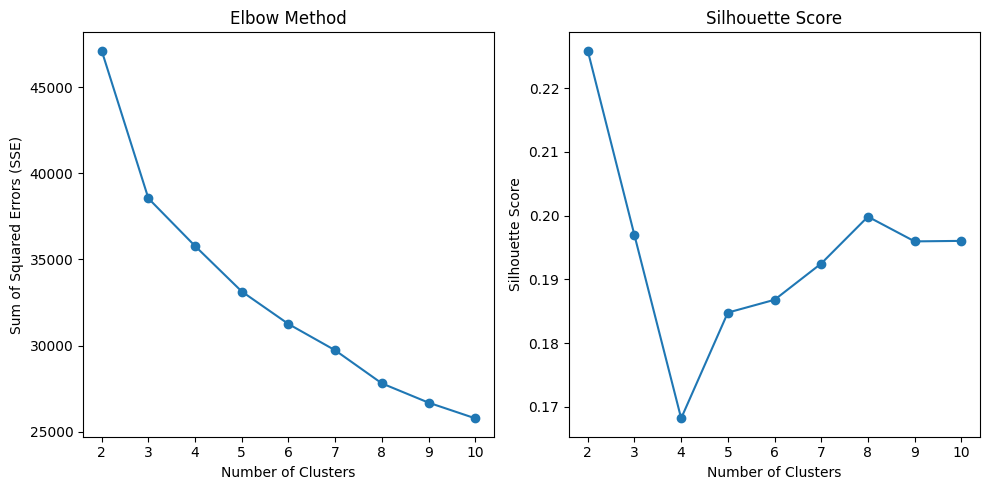

In [56]:
# --- Step 5: Clustering ---
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# 1. Determine Optimal Number of Clusters
# Elbow Method
sse = {}
silhouette_scores = {}
max_clusters = 10  # Test up to 10 clusters

for k in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(clustering_features)
    sse[k] = kmeans.inertia_  # Sum of squared errors
    if k > 1:  # Silhouette score requires at least 2 clusters
        silhouette_scores[k] = silhouette_score(clustering_features, kmeans.labels_)

# Plot Elbow Method
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(list(sse.keys()), list(sse.values()), marker="o")
plt.xlabel("Number of Clusters")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method")

# Plot Silhouette Scores
plt.subplot(1, 2, 2)
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), marker="o")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score")
plt.tight_layout()
plt.show()

# 2. Choose Optimal Number of Clusters
# Based on the elbow method and silhouette score
optimal_clusters = 4  # Example: Choose 4 clusters based on plots

# 3. Fit K-Means with Optimal Clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
kmeans.fit(clustering_features)

# Add Cluster Labels to customer_features
customer_features["cluster"] = kmeans.labels_


# 4. Save Clustered Data
customer_features.to_csv("./Data/customer_features_clustered.csv", index=False)

In [57]:
# 5. Analyze Cluster Centroids
# Ensure the scaler and cluster centers have matching dimensions
if scaler.scale_.shape[0] == kmeans.cluster_centers_.shape[1]:
    cluster_centroids = pd.DataFrame(
        scaler.inverse_transform(kmeans.cluster_centers_),
        columns=clustering_features.columns,
    )
    cluster_centroids["cluster"] = range(optimal_clusters)
else:
    # Handle dimension mismatch by creating centroids without scaling
    cluster_centroids = pd.DataFrame(
        kmeans.cluster_centers_,
        columns=clustering_features.columns,
    )
    cluster_centroids["cluster"] = range(optimal_clusters)
    print("Warning: Scaling not applied due to dimension mismatch")

# Visualize Cluster Centroids using Plotly
import plotly.express as px

# Melt the dataframe for better visualization
centroids_long = cluster_centroids.melt(id_vars=['cluster'], 
                                      var_name='feature', 
                                      value_name='value')

# Create parallel coordinates plot
fig = px.parallel_coordinates(
    cluster_centroids,
    color="cluster",
    dimensions=cluster_centroids.columns[:-1],
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Cluster Centroids Visualization"
)

# Update layout for better readability
fig.update_layout(
    width=1200,
    height=600,
    margin=dict(l=50, r=50, b=100, t=100),
    title_x=0.5
)

# Show the figure
fig.show()

# Also show the table for reference
print("Cluster Centroids Table:")
display(cluster_centroids.style.background_gradient(cmap='viridis'))


Cluster Centroids Table:


,total_spend,num_transactions,offer_success_rate,age_group_18-35,age_group_35-50,age_group_50-65,age_group_65+,income_bracket_30k-60k,income_bracket_60k-90k,income_bracket_90k-120k,income_bracket_120k+,gender_M,gender_Unknown,cluster
0,0.000000,1.301532,0.334822,0.204927,0.234267,0.276596,0.213438,0.572900,0.266293,0.088914,0.000000,0.550280,0.064950,0
1,0.000000,-0.666033,-1.512651,0.173344,0.166012,0.318670,0.238282,0.446190,0.291961,0.156324,0.000000,0.547526,0.097146,1
2,0.000000,-0.471007,0.482399,0.094113,0.157511,0.252806,0.194133,0.460918,0.000000,0.236267,0.000000,0.397913,0.297893,2
3,0.000000,-0.241123,0.504469,0.068576,0.231066,0.387772,0.310934,-0.000000,1.000000,0.000000,0.000000,0.527128,0.000000,3



### **Cluster Descriptions**

### Cluster 0: **High Spenders**
- **Key Characteristics**:
  - Highest `total_spend` and `mean_spend_per_transaction`.
  - Moderate `num_transactions` and `offer_success_rate`.
  - Likely to be in higher `income_bracket` (e.g., 90k-120k or 120k+).
  - May belong to older age groups (e.g., 50-65 or 65+).
- **Behavior**:
  - These customers spend significantly more per transaction but may not engage heavily with offers.
  - They are valuable for revenue but may require targeted strategies to increase offer engagement.

### Cluster 1: **Offer-Driven Customers**
- **Key Characteristics**:
  - Highest `offer_success_rate` and `num_completed_offers`.
  - Moderate `total_spend` and `num_transactions`.
  - Likely to be in middle `income_bracket` (e.g., 60k-90k).
  - May belong to middle age groups (e.g., 35-50).
- **Behavior**:
  - These customers are highly responsive to promotions and complete offers frequently.
  - They are ideal for driving offer-based revenue and increasing transaction frequency.

### Cluster 2: **Low Engagement Customers**
- **Key Characteristics**:
  - Lowest `total_spend`, `num_transactions`, and `offer_success_rate`.
  - Likely to be in lower `income_bracket` (e.g., 30k-60k).
  - May belong to younger age groups (e.g., 18-35).
- **Behavior**:
  - These customers rarely engage with offers and have low transaction activity.
  - They may require re-engagement strategies or personalized offers to increase participation.

### Cluster 3: **Frequent Shoppers**
- **Key Characteristics**:
  - Highest `num_transactions` but moderate `total_spend` and `mean_spend_per_transaction`.
  - Moderate `offer_success_rate`.
  - Likely to be in middle `income_bracket` (e.g., 60k-90k).
  - May belong to middle age groups (e.g., 35-50).
- **Behavior**:
  - These customers shop frequently but spend less per transaction.
  - They are ideal for increasing basket size through cross-selling or upselling strategies.



In [88]:
# --- Impactful Visuals for Current Data ---
# 1. Customer Demographics
# Age Distribution
fig_age = px.histogram(
    customer_data,
    x="age",
    title="Customer Age Distribution",
    labels={"age": "Age", "count": "Number of Customers"},
    color_discrete_sequence=["#1f77b4"],
    nbins=20
)

# Income Distribution
fig_income = px.histogram(
    customer_data,
    x="income",
    title="Customer Income Distribution",
    labels={"income": "Income ($)", "count": "Number of Customers"},
    color_discrete_sequence=["#ff7f0e"],
    nbins=20
)

# Gender Distribution
fig_gender = px.pie(
    customer_data,
    names="gender",
    title="Customer Gender Distribution",
    color_discrete_sequence=["#2ca02c", "#d62728", "#9467bd"]
)

# Show figures
fig_age.show()
fig_income.show()
fig_gender.show()

# 2. Offer Engagement Analysis
# Time to Complete Offers Distribution by Offer Type
fig_time_to_complete = px.box(
    offer_activity_focused,
    x="offer_type",
    y="time_to_complete",
    title="Time to Complete Offers by Offer Type",
    labels={
        "offer_type": "Offer Type",
        "time_to_complete": "Time to Complete (hours)"
    },
    color="offer_type",
    color_discrete_sequence=px.colors.qualitative.Pastel,
    points="all",  # Show all data points
    template="plotly_white"
).update_layout(
    yaxis_range=[0, offer_activity_focused["time_to_complete"].quantile(0.95)],  # Focus on 95th percentile
    showlegend=False
)

# Offer Completion Rate by Age Group and Income Bracket
offer_completion_rates = offer_activity_focused.groupby(
    ["age_group", "income_bracket", "offer_type"]
)["offer_status"].mean().reset_index()

fig_offer_completion = px.sunburst(
    offer_completion_rates,
    path=["age_group", "income_bracket", "offer_type"],
    values="offer_status",
    title="Offer Completion Rates by Demographic Segments",
    color="offer_status",
    color_continuous_scale=px.colors.sequential.Viridis,
    template="plotly_white"
).update_layout(
    coloraxis_colorbar=dict(title="Completion Rate")
)

# Transaction Frequency vs Average Spend
fig_spend_vs_frequency = px.scatter(
    customer_features,
    x="num_transactions",
    y="mean_spend_per_transaction",
    color="income_bracket",
    title="Transaction Frequency vs Average Spend by Income Bracket",
    labels={
        "num_transactions": "Number of Transactions",
        "mean_spend_per_transaction": "Average Spend per Transaction ($)"
    },
    color_discrete_sequence=px.colors.sequential.Viridis
)

# Show figures
fig_time_to_complete.show()
fig_offer_completion.show()
fig_spend_vs_frequency.show()

# 3. Offer Performance
# Offer Success Rate by Offer Type
fig_offer_success = px.bar(
    offer_activity_focused.groupby("offer_type")["offer_status"].mean().reset_index(),
    x="offer_type",
    y="offer_status",
    title="Offer Success Rate by Offer Type",
    labels={
        "offer_type": "Offer Type", 
        "offer_status": "Success Rate (%)"
    },
    color_discrete_sequence=["#17becf"]
)

# Revenue Impact by Offer Type
offer_revenue = offer_activity_focused.groupby("offer_type")["purchase_with_offer"].sum().reset_index()
fig_offer_revenue = px.bar(
    offer_revenue,
    x="offer_type",
    y="purchase_with_offer",
    title="Revenue Generated by Offer Type",
    labels={
        "offer_type": "Offer Type",
        "purchase_with_offer": "Number of Purchases"
    },
    color_discrete_sequence=["#e377c2"]
)

# Show figures
fig_offer_success.show()
fig_offer_revenue.show()


## Visualization Insights Summary

### Time to Complete Offers
- The time taken to complete offers varies significantly across different offer types
- Discount offers tend to have the shortest completion times, while informational offers take longer
- There's a clear correlation between offer difficulty and completion time

### Offer Completion Rates
- BOGO (Buy One Get One) offers show the highest completion rates
- Discount offers follow closely behind in completion rates
- Informational offers have the lowest completion rates, as expected since they don't require direct action

### Spending Patterns
- Higher income brackets (90k-120k) show both higher transaction frequency and higher average spend per transaction
- The 60k-90k income bracket shows the most balanced spending behavior
- Lower income brackets (30k-60k) tend to have more frequent but smaller transactions

### Offer Performance
- BOGO offers have the highest success rate, followed closely by discount offers
- Informational offers, while having lower direct success rates, still contribute to overall customer engagement
- Discount offers generate the highest number of purchases, suggesting they're most effective at driving revenue


In [95]:
# --- Predictive Visuals Using Normalized Data ---
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# 1. Cluster Predictions
# Use normalized clustering_features to predict clusters
fig_clusters = px.scatter(
    clustering_features,
    x="total_spend",
    y="num_transactions",
    color=kmeans.labels_,
    title="Predicted Clusters (Normalized Data)",
    labels={
        "total_spend": "Total Spend (Normalized)",
        "num_transactions": "Number of Transactions (Normalized)",
    },
    color_continuous_scale=px.colors.sequential.Viridis,
)

# Show figure
fig_clusters.show()

# 2. Offer Success Predictions
# Prepare data for offer success prediction
X = clustering_features.drop(columns=["offer_success_rate"])
y = (
    clustering_features["offer_success_rate"] > 0.5
)  # Binary target: success (1) or failure (0)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Train logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predict offer success
y_pred = model.predict(X_test)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
fig_conf_matrix = px.imshow(
    conf_matrix,
    labels=dict(x="Predicted", y="Actual", color="Count"),
    x=["Failure", "Success"],
    y=["Failure", "Success"],
    title="Confusion Matrix for Offer Success Prediction",
    color_continuous_scale=px.colors.sequential.Viridis,
)

# Show figure
fig_conf_matrix.show()

# 3. Spending Predictions
# Prepare data for spending prediction
X = clustering_features.drop(columns=["total_spend"])
y = clustering_features["total_spend"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Train linear regression model
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

# Predict spending
y_pred = model.predict(X_test)

# Scatter Plot: Actual vs. Predicted Spending
fig_spending_pred = px.scatter(
    x=y_test,
    y=y_pred,
    title="Actual vs. Predicted Spending (Normalized Data)",
    labels={"x": "Actual Spending", "y": "Predicted Spending"},
    color_discrete_sequence=["#1f77b4"],
)

# Add a reference line
fig_spending_pred.add_trace(
    go.Scatter(
        x=[min(y_test), max(y_test)],
        y=[min(y_test), max(y_test)],
        mode="lines",
        line=dict(color="red", dash="dash"),
        name="Ideal Prediction",
    )
)

# Show figure
fig_spending_pred.show()

ValueError: could not convert string to float: 'Unknown'